# Logistic Regression

If instead of a “hard” **binary classifier** where the output is only one of two states ([+1, -1] or [1, 0]) we now want a classifier that outputs the probability that the input belongs to a class, then we can use **Logistic Regression (LR)**. An example where LR is useful is in medical diagnostics where you want to know the probability that the patient has a certain disease. Another example is in weather predictions wherein you want to know the percent chance of rain.

In [1]:
import numpy as np
import pandas as pd
import cv2, glob, random, skimage
import matplotlib.pyplot as plt
from PIL import Image
from skimage import filters, measure, morphology

plt.rcParams["figure.figsize"] = (4,4)
plt.rcParams["savefig.dpi"] = 300
plt.rcParams["savefig.bbox"] = "tight"
plt.rcParams["savefig.pad_inches"] = 0.1
# plt.rcParams["text.usetex"] = True

# Supress warnings
import warnings
warnings.filterwarnings('ignore')

## Training data and processing

In [2]:
def jpg2png(folder):
    jpgimgs = glob.glob("Fruits Dataset/" + str(folder) + "/*.jpg")
    for imgs in jpgimgs:
        img = cv2.imread(imgs)
        cv2.imwrite(imgs[:-3] + 'png', img)

In [3]:
def fruit_select(fruit_name, data_points = 12):
    cv_img = []
    dataset = glob.glob("Fruits Dataset/" + str(fruit_name) + "/*.png")
    for img in dataset:
        n = cv2.imread(img)
        n = n[:,:,::-1] # reverse color channels
        cv_img.append(n)
        
    filtered_cv_img = random.sample(cv_img, data_points)
    return filtered_cv_img

In [4]:
def mean_RGB(img):
    R, G, B = img[:,:,0], img[:,:,1], img[:,:,2]
    R_ave, G_ave, B_ave = np.mean(R), np.mean(G), np.mean(B)
    return R_ave/255, G_ave/255, B_ave/255

In [5]:
def RGB_extract(sampleimgs):
    R, G, B = [], [], []
    for img in sampleimgs:
        R_ave, G_ave, B_ave = mean_RGB(img)
        R.append(R_ave), G.append(G_ave), B.append(B_ave)
    return R, G, B

In [6]:
def feature_extract(sampleimgs, res = (18,9)):
    fig, ax = plt.subplots(2, 6, figsize = res, sharey = "row", tight_layout = True)
    ax = ax.flatten()
    
    for i, img in enumerate(sampleimgs):
        R, G, B = mean_RGB(img)
        ax[i].imshow(img)
        ax[i].set_title("Mean RGB = [{:.2f}, {:.2f}, {:.2f}]".format(R, G, B))
        ax[i].axis("off")

***
## Regression algorithm

We adapt the same code used in perceptron, but we modify the activation function from a unit step to a continuous sigmoid function. In logistic regression, we introduce the **logit function** which is the logarithm of the odds ratio of probability $p$, $$ \text{logit}(p) = \log \left( \frac{p}{1-p} \right) $$

For example, $p$ can be $p(y=1|x)$ or the probability that the input belongs to class 1 given its feature vector $x$. The inverse of the logit function is the logistic function $$ \phi(a) = \frac{1}{1+\exp(-\beta\ a)} $$

The coefficient $\beta$ controls the steepness of the sigmoid function. The sigmoid function resembles a step function  except that the transition from one state to the other is smooth and continuous. It is also known as a “squashing” function because it squashes any input between $-\infty$ to $\infty$ to a number between 0 and 1.

In [7]:
def sigmoid_function(a, beta = 1):
    return 1/(1 + np.exp(-beta*a))

In [8]:
def regression(data1, data2, learning_rate = 0.01, epoch = 2000):
    samples = np.hstack([data1, data2])
    features = np.array(samples).T # samples - take the mean RGB from two objects
    bias_element = np.ones(np.shape(features)[0]).reshape(np.shape(features)[0], -1) # add a bias of 1.0
    features = np.hstack((bias_element, features))
    
    # initialize labels for both classes
    labels = np.zeros(np.shape(features)[0])
    labels[0:np.shape(features)[0]//2] = 0 # must be 0 instead of -1
    labels[np.shape(features)[0]//2:] = 1
    
    # initialize weights to random numbers
    weights = np.random.random(len(features[0])) 
    
    # apply weight change rule
    for time in range(epoch):
        for i, x in enumerate(features):
            a = np.dot(x.T, weights)
            output = sigmoid_function(a)
            deltaw = learning_rate * (labels[i] - output) * x
            weights += deltaw
    
    return weights

In [9]:
def test_regression(img, weights, bias = 1.0):
    R, G, B = mean_RGB(img)
    feature = np.array([bias, R, G, B])
    inputs = np.dot(feature.T, weights)
    probability = sigmoid_function(inputs)
    return inputs, probability

***
## Predicting ripeness of tomatoes

Assigning green tomatoes as unripene while cherry red tomatoes are considered as ripe classifications. Mixed images of tomatoes adapted from this [site](https://www.kaggle.com/datasets/olgabelitskaya/tomato-cultivars?select=03_002.png). 

In [10]:
green = fruit_select("Tomato Green")
red = fruit_select("Tomato Red")

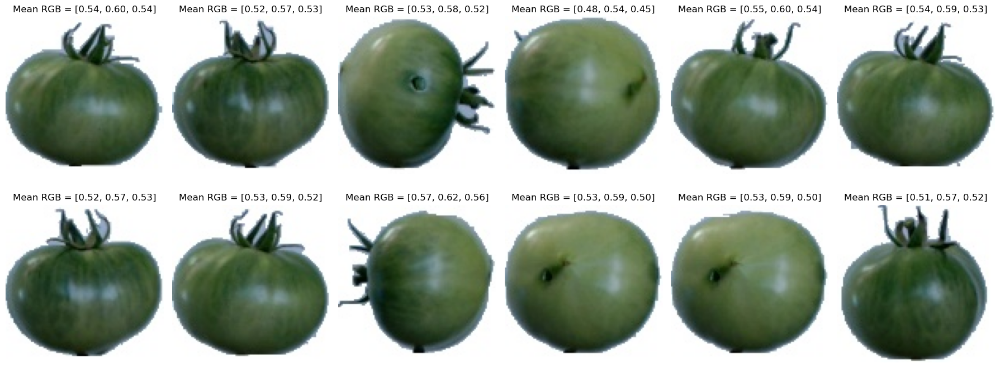

In [11]:
feature_extract(green)
plt.savefig("unripe tomatoes.png")

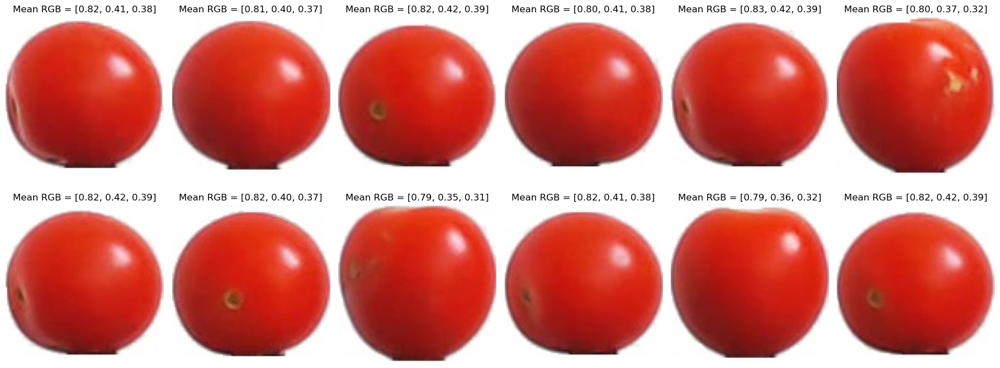

In [12]:
feature_extract(red)
plt.savefig("ripe tomatoes.png")

In [13]:
fruit_basis = regression(RGB_extract(green), RGB_extract(red))

In [14]:
mixed = fruit_select("Tomato Mixed", data_points = 30)

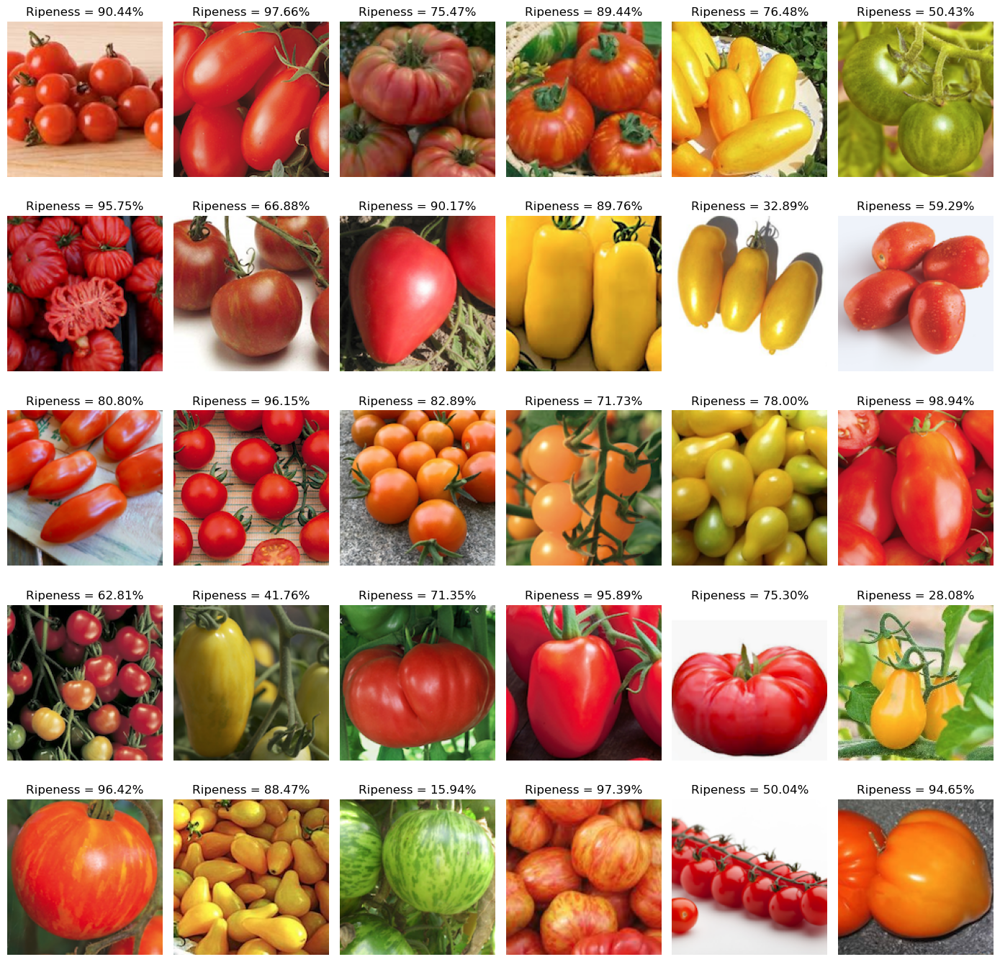

In [15]:
fig, ax = plt.subplots(5, 6, figsize = (14, 14), tight_layout = True)
ax = ax.flatten()
mixed_input = []
mixed_prob = []

for i, img in enumerate(mixed):
    inputs, ripeness = test_regression(img, fruit_basis)
    mixed_input.append(inputs)
    mixed_prob.append(ripeness)
    ax[i].imshow(img)
    ax[i].set_title("Ripeness = {:.2f}%".format(ripeness*100))
    ax[i].axis("off")

# fig.savefig("tomato ripeness 2.png")

### Sigmoid fit of probabilities

In [16]:
xvals = np.linspace(-10, 10, 1000)
yvals = sigmoid_function(xvals)

In [17]:
unripe_tomatoes = fruit_select("Tomato Green", 30)
unripe_input, unripe_prob = [], []

for img in unripe_tomatoes:
    inputs, ripeness = test_regression(img, fruit_basis)
    unripe_input.append(inputs)
    unripe_prob.append(ripeness)

In [18]:
ripe_tomatoes = fruit_select("Tomato Red", 30)
ripe_input, ripe_prob = [], []

for img in ripe_tomatoes:
    inputs, ripeness = test_regression(img, fruit_basis)
    ripe_input.append(inputs)
    ripe_prob.append(ripeness)

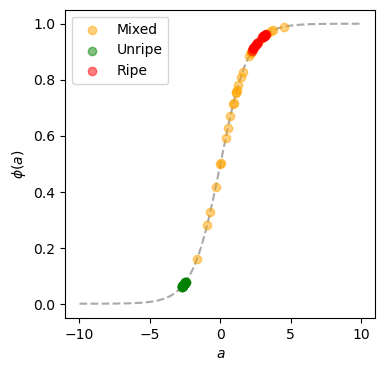

In [19]:
plt.plot(xvals, yvals, linestyle = "--", color = "darkgray")
plt.scatter(mixed_input, mixed_prob, color = "orange", label = "Mixed", alpha = 0.5, zorder = 4)
plt.scatter(unripe_input, unripe_prob, color = "green", label = "Unripe", alpha = 0.5, zorder = 4)
plt.scatter(ripe_input, ripe_prob, color = "red", label = "Ripe", alpha = 0.5, zorder = 4)
plt.xlabel("$a$")
plt.ylabel("$\phi(a)$")
plt.legend()
plt.savefig("tomato sigmoid fit.png")

***
## Wildfire prediction dataset

Satellite images of areas that previously experienced wildfires in Canada. We can build a model that can predict whether an area is at risk of a wildfire or not using the mean green values of images. Dataset repository adapted from this [site](https://www.kaggle.com/datasets/abdelghaniaaba/wildfire-prediction-dataset).

In [20]:
def img_select(folder_name, data_points = 12):
    cv_img = []
    dataset = glob.glob(folder_name + "/*.jpg")
    for img in dataset:
        n = cv2.imread(img)
        n = n[:,:,::-1] # reverse color channels
        cv_img.append(n)
        
    filtered_cv_img = random.sample(cv_img, data_points)
    return filtered_cv_img

In [21]:
wildfire = img_select("Satellite Dataset/Wildfire")
nowildfire = img_select("Satellite Dataset/No Wildfire")

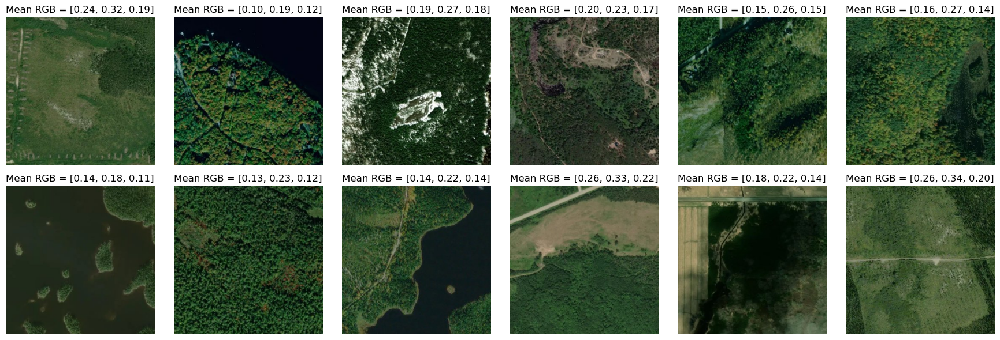

In [22]:
feature_extract(wildfire, res = (18, 6))
plt.savefig("wildfire prone areas.png")

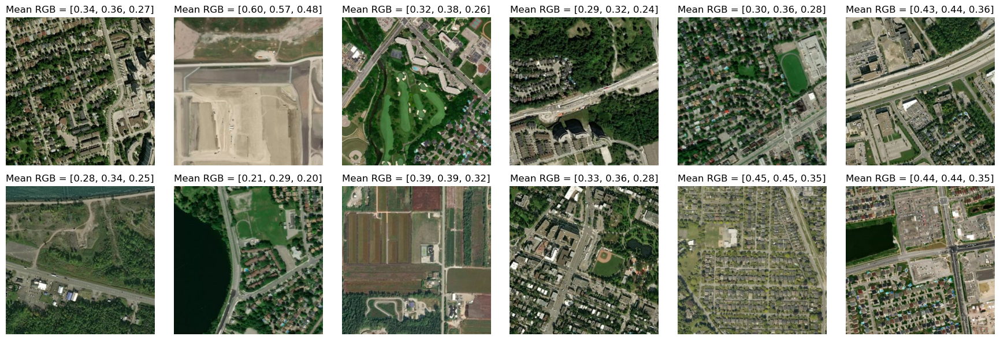

In [23]:
feature_extract(nowildfire, res = (18, 6))
plt.savefig("not wildfire prone areas.png")

In [24]:
random_wildfire = img_select("Satellite Dataset/Wildfire", data_points = 15)
random_nowildfire = img_select("Satellite Dataset/No Wildfire", data_points = 15)
random_satelliteimgs = random.sample((random_wildfire + random_nowildfire), 30)

In [25]:
satellite_basis = regression(RGB_extract(nowildfire), RGB_extract(wildfire))

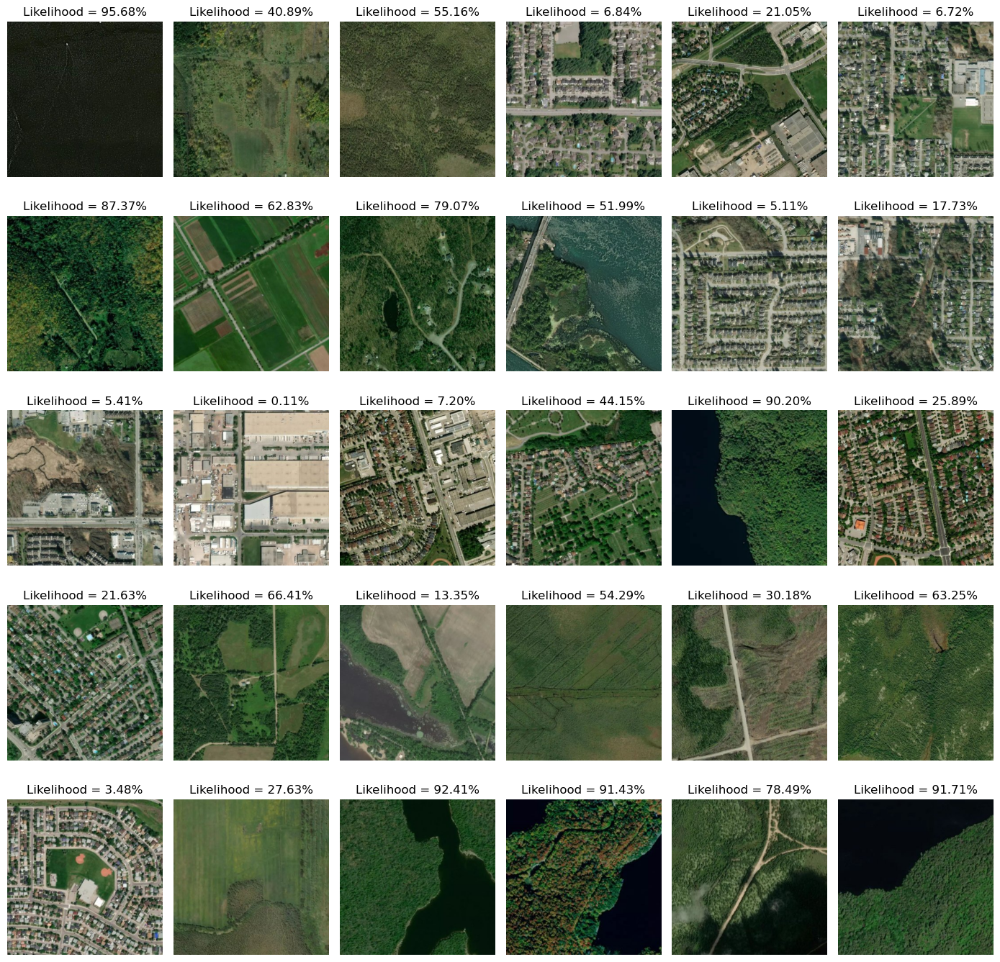

In [26]:
fig, ax = plt.subplots(5, 6, figsize = (14, 14), tight_layout = True)
ax = ax.flatten()
satellite_input = []
satellite_prob = []

for i, img in enumerate(random_satelliteimgs):
    inputs, likelihood = test_regression(img, satellite_basis)
    satellite_input.append(inputs)
    satellite_prob.append(likelihood)
    ax[i].imshow(img)
    ax[i].set_title("Likelihood = {:.2f}%".format(likelihood*100))
    ax[i].axis("off")

# fig.savefig("wildfire predictions 2.png")

### Sigmoid fit of probabilities

In [27]:
wildfire_input, wildfire_prob = [], []

for img in wildfire:
    inputs, likelihood = test_regression(img, satellite_basis)
    wildfire_input.append(inputs)
    wildfire_prob.append(likelihood)

In [28]:
nowildfire_input, nowildfire_prob = [], []

for img in nowildfire:
    inputs, likelihood = test_regression(img, satellite_basis)
    nowildfire_input.append(inputs)
    nowildfire_prob.append(likelihood)

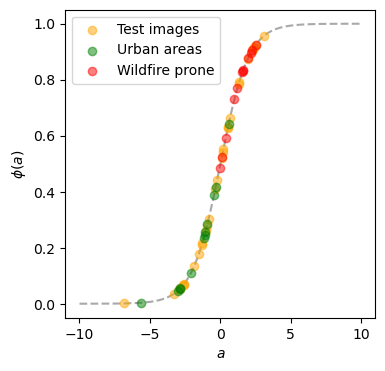

In [29]:
plt.plot(xvals, yvals, linestyle = "--", color = "darkgray")
plt.scatter(satellite_input, satellite_prob, color = "orange", label = "Test images", alpha = 0.5, zorder = 4)
plt.scatter(nowildfire_input, nowildfire_prob, color = "green", label = "Urban areas", alpha = 0.5, zorder = 4)
plt.scatter(wildfire_input, wildfire_prob, color = "red", label = "Wildfire prone", alpha = 0.5, zorder = 4)
plt.xlabel("$a$")
plt.ylabel("$\phi(a)$")
plt.legend()
plt.savefig("satellite sigmoid fit.png")